In [61]:
import datetime
import pandas as pd
import numpy as np

data = pd.read_csv('data_3.csv')
data['Date'] = pd.to_datetime(data['Date'])
data['StartDate'] = pd.to_datetime(data['StartDate'])
data['EndDate'] = pd.to_datetime(data['EndDate'])

# Tickets:     clientes reais
# TicketsPrev: clientes estimados
# Persons:     número de pessoas em caixa (estimado)

data

,RosterCode,Date,StartDate,EndDate,Tickets,TicketsPrev,Persons
0,10,2021-11-01,2021-11-01 09:00:00,2021-11-01 10:00:00,32,55,2
1,10,2021-11-01,2021-11-01 10:00:00,2021-11-01 11:00:00,57,69,3
2,10,2021-11-01,2021-11-01 11:00:00,2021-11-01 12:00:00,87,112,4
3,10,2021-11-01,2021-11-01 12:00:00,2021-11-01 13:00:00,97,118,4
4,10,2021-11-01,2021-11-01 13:00:00,2021-11-01 14:00:00,100,130,4
...,...,...,...,...,...,...,...
204582,75,2022-10-31,2022-10-31 17:00:00,2022-10-31 18:00:00,52,38,2
204583,75,2022-10-31,2022-10-31 18:00:00,2022-10-31 19:00:00,122,66,3
204584,75,2022-10-31,2022-10-31 19:00:00,2022-10-31 20:00:00,125,92,3
204585,75,2022-10-31,2022-10-31 20:00:00,2022-10-31 21:00:00,114,70,3


In [62]:
data_filtered = data.drop(columns=['Date', 'EndDate' , 'Persons'])
data_filtered

,RosterCode,StartDate,Tickets,TicketsPrev
0,10,2021-11-01 09:00:00,32,55
1,10,2021-11-01 10:00:00,57,69
2,10,2021-11-01 11:00:00,87,112
3,10,2021-11-01 12:00:00,97,118
4,10,2021-11-01 13:00:00,100,130
...,...,...,...,...
204582,75,2022-10-31 17:00:00,52,38
204583,75,2022-10-31 18:00:00,122,66
204584,75,2022-10-31 19:00:00,125,92
204585,75,2022-10-31 20:00:00,114,70


In [79]:
"""
def model_metrics(y_true, y_pred):
    d_metrics = {}
    d_metrics['mse'] = np.sqrt(mean_squared_error(y_true, y_pred))
    d_metrics['mae'] = mean_absolute_error(y_true, y_pred)
    d_metrics['r2_score'] = r2_score(y_true, y_pred)
    
    return d_metrics
"""

def streming_outlier_detection(ts, k, s, alpha):
    ts_copy = np.copy(ts)
    outliers = []

    prev_elements = np.ones(k)

    for i in range(k*s,len(ts)):
        for j in range(k):
            prev_elements[j]=ts[i-(j+1)*s]
            
        mu=np.mean(prev_elements)
        sigma=np.std(prev_elements)
        
        upper_whisker=mu+alpha*sigma
        lower_whisker=mu-alpha*sigma
        
        if ts[i]>upper_whisker or ts[i]<lower_whisker:
            outliers.append([i,ts[i]])
            masked=np.ma.masked_equal(prev_elements, 0)
            ts_copy[i]=np.where(masked.mean()==None, 0, masked.mean())
            
    return outliers, ts_copy

def to_supervised(timeseries, n_lags: int, n_output: int = 1):
    N = len(timeseries)

    X = np.zeros((N - n_lags - n_output + 1, n_lags))
    y = np.zeros((X.shape[0], n_output))

    for i in range(N - n_lags):
        if i + n_lags + n_output > N:
            break

        aux = np.zeros(n_lags)

        for j in range(i, i + n_lags, 1):
            aux[j - i] = timeseries[j]

        X[i,:] = aux
        y[i,:] = timeseries[i + n_lags : i + n_lags + n_output]

    return X, y

def pre_process_data(data):
    data['ds'] = pd.to_datetime(data['ds'])
    data.shape

    data_resample = pd.DataFrame(data.resample('H', on = 'ds').sum())
    data_resample.reset_index(inplace=True)

    return data_resample


----------------------------------------------------------------------------------------------------------------
Store 10
----------------------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------------------
Store 11
----------------------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------------------
Store 13
----------------------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------------------
Store 14
----------------------------------------------------------------------------------------------------------------


---------------------------------------------------

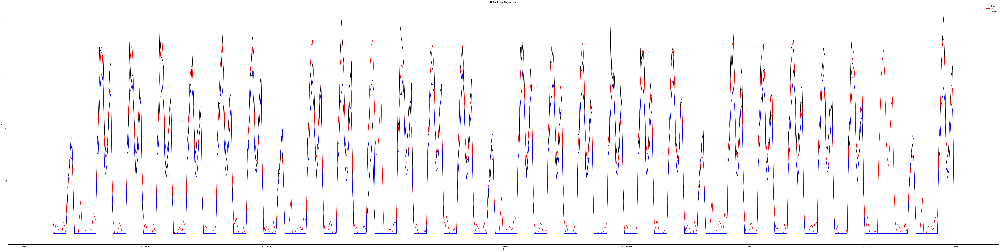

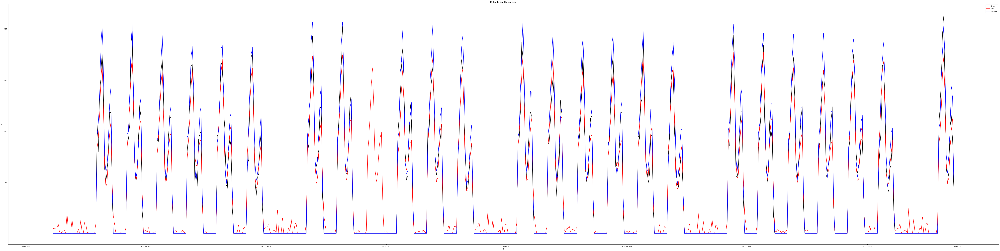

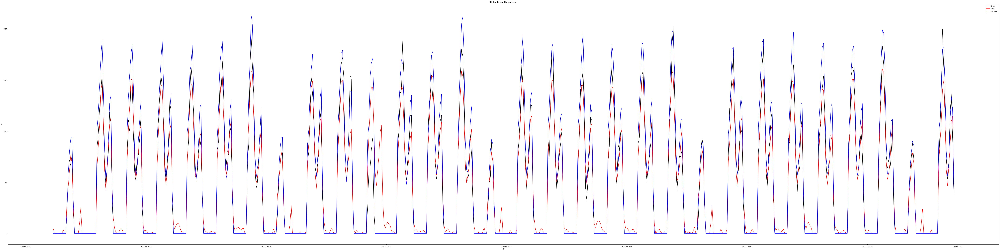

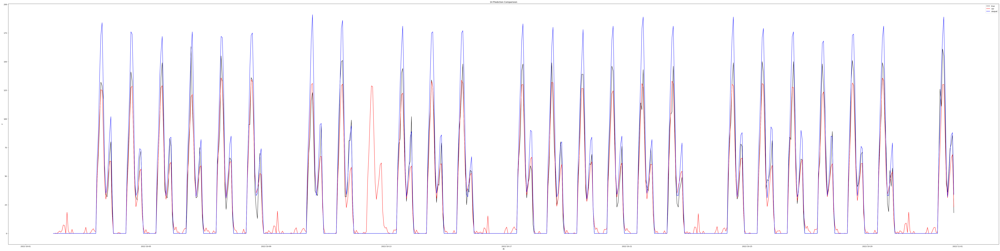

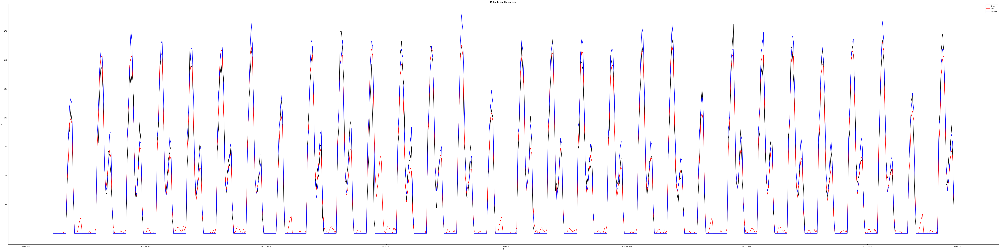

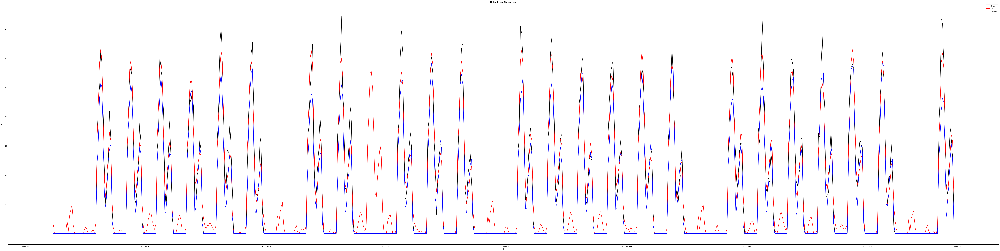

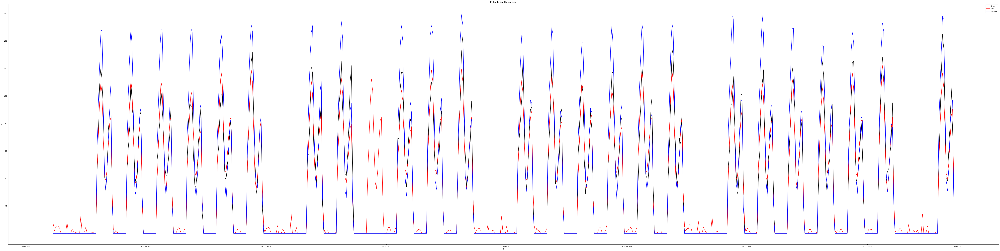

In [86]:
stores = pd.value_counts(data_filtered['RosterCode'].values.ravel())
stores_ids = list(stores.index)
stores_ids.sort()

from sklearn.neural_network import MLPRegressor
#from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from matplotlib import pyplot
from datetime import datetime, timedelta

j = 0
for id in stores_ids:
    store_data = data_filtered.loc[data_filtered['RosterCode'] == id]
    store_data = store_data.drop(columns=['RosterCode'])
    
    #print(store_data.shape)
    #print(store_data.head(50))
    #n_store_rec = store_data.shape[0]
    
    print()
    print('----------------------------------------------------------------------------------------------------------------')
    print('Store ' + str(id))
    print('----------------------------------------------------------------------------------------------------------------')
    print()
    #----------------------------------------------------------------------------------------------------------------

    store_data.rename(columns={"StartDate": "ds", "Tickets": "y", 'TicketsPrev': 'sisq'}, inplace=True)
    #print(store_data.head(25))
    store_data = pre_process_data(store_data)
    #print(store_data.head(25))
    
    data = store_data.drop(columns=['sisq'])    
    #data = store_data.drop(columns=['TicketsPrev'])
    #data.rename(columns={"StartDate": "ds", "Tickets": "y"}, inplace=True)
    
    #print(data.shape)
    #print(data.head(50))

    #----------------------------------------------------------------------------------------------------------------
    K = 53
    S = 168
    ALPHA = 2
    MAX_N_ITERATIONS = 1000
    n_lags = 720
    forecast_period = 720

    train_data = data[:-forecast_period].copy()
    pred_data = store_data[-forecast_period:].copy()
    #pred_data.rename(columns={"StartDate": "ds", "Tickets": "y", 'TicketsPrev': 'sisqual'}, inplace=True)

    """
    print(store_data.shape)
    print(store_data.tail(25))
    
    print(train_data.shape)
    print(train_data.tail(25))
    
    print(pred_data.shape)
    print(pred_data.head(25))
    break
    """
    #----------------------------------------------------------------------------------------------------------------
    #data = pre_process_data(data)
    #data = pre_process_data(train_data)

    #print(data.shape)
    #print(data.head(50))
    
    outliers, filtered_values = streming_outlier_detection(data['y'].values, k=K, s=S, alpha=ALPHA)
    data['filtered_values'] = filtered_values

    #print(data.shape)
    #print(data.head(50))
    
    X, y = to_supervised(data['filtered_values'].values, n_lags=n_lags, n_output=forecast_period)
    
    """
    X_train = X[:-1]
    y_train = y[:-1]
    X_test = X[-1].reshape(1,-1)
    y_test = y[-1].reshape(1,-1)

    print(X.shape)
    print(y.shape)

    print(X_train)
    print(y_train)
    print(X_test)
    print(y_test)
    
    print(X_train.shape)
    print(y_train.shape)
    print(X_test.shape)
    print(y_test.shape)
    """
    
    # create model
    mlp_model = MLPRegressor(max_iter=MAX_N_ITERATIONS)

    # train model
    #mlp_model.fit(X_train, y_train)
    mlp_model.fit(X, y)

    # predict
    #mlp_model_forecast = mlp_model.predict(X_test)

    #mlp_model_metrics = model_metrics(y_test.flatten(), mlp_model_forecast.flatten())
    #print(mlp_model_metrics)

    y = np.asarray([train_data['y'][-forecast_period:].tolist()])
    
    #print(y.shape)
    
    y.reshape(1, -1)
    
    forecast = mlp_model.predict(y)
    forecast = forecast.flatten().tolist()
    forecast = [0 if x < 0 else x for x in forecast]
    
    #print(pred_data['y'].shape)
    #print(len(forecast))
    #print( pred_data['sisqual'].shape)
    
    x = pred_data['ds']

    d = train_data['ds'][-1:].copy()
    #print(d)
    #print(type(d))
    #print(d.tolist())
    #print(d.iat[0, 0])
    
    d = d.tolist()[0]
    
    format = "%Y-%m-%d %H:%M:%S"
    ini_datetime = datetime.strptime(str(d), format)
    ds = []

    #print(ini_datetime)
    
    i = 1
    while i <= forecast_period:
        ds += [str(ini_datetime + timedelta(hours = i))]
        i += 1    

    #print(x)
    #print(ds)
        
    fig, ax = pyplot.subplots(figsize=(80, 20), layout='constrained')
    ax.plot(x, pred_data['y'], label='true', color='black')
    ax.plot(x, forecast, label='our', color='red')
    ax.plot(x, pred_data['sisq'], label='sisqual', color='blue')
    
    ax.set_xlabel('ds')
    ax.set_ylabel('y')
    ax.set_title(str(id) + " Prediction Comparision")
    ax.legend()
    fig.savefig(str(id) + '_%_pred_prec_comp.png')
    
    j += 1
    
    if j > 6:
        break
 